In [1]:
import networkx as nx
import pandas as pd

df = pd.read_csv("finale_data_after_processing.csv", encoding='latin1')

In [2]:
df

,Number,Titre,Description,section,Figures,Definition,kw_bert,synonyms,Subject,Relation,Object
0,11.2,Identify Risks,\nthe process of identifying individual projec...,NaN,NaN,process identify individual project risk well ...,"['project risk documenting', 'project risk sou...","[""['project risk list', 'project risk base', '...",process,identify,individual project risk source
1,11.3,Perform Qualitative Risk Analysis,\nthe process of prioritizing individual proje...,NaN,NaN,process prioritize individual project risk ana...,"['project risk analysis', 'project risk', 'ind...","[""['project risk exposure', 'project risk', 'i...",process,prioritize,individual project risk analysis action assess...
2,11.4,Perform Quantitative Risk Analysis,\nthe process ofnumerically analyzing the comb...,NaN,NaN,process ofnumerically analyze combine effect i...,"['project risk', 'uncertainty overall project'...","[""['project risk exposure', 'project risk', 'i...",process analyze,combine,effect
3,11.5,Plan Risk Responses,"\nthe process of developing options, selecting...",NaN,NaN,process develop option select strategy agree a...,"['project risk exposure', 'project risk', 'ind...","[""['project risk plan', 'project document cons...",process,develop,option select strategy
4,11.7,Monitor Risks,\nthe process of monitoring the implementation...,NaN,figure 11-1,process monitor implementation agree - upon ri...,"['project risk control', 'project process', 'p...","[""['project risk process', 'project risk proje...",process monitor implementation agree risk resp...,track,identify risk
...,...,...,...,...,...,...,...,...,...,...,...
1504,0.5.1.4,Scenario Analysis,scenario analysis for risk response planning ...,NaN,NaN,scenario analysis risk response planning invol...,"['risk project management', 'project risk mana...","['risk project management', 'project risk mana...",overall project risk,derive,individual risk
1505,0.5.1.4,Scenario Analysis,scenario analysis for risk response planning ...,NaN,NaN,scenario analysis risk response planning invol...,"['risk project management', 'project risk mana...","['risk project management', 'project risk mana...",multiple perspective result document objectivity,result,effective present opportunity explicit identif...
1506,0.5.1.4,Scenario Analysis,scenario analysis for risk response planning ...,NaN,NaN,scenario analysis risk response planning invol...,"['risk project management', 'project risk mana...","['risk project management', 'project risk mana...",objective risk,link,tool technique
1507,0.5.1.4,Scenario Analysis,scenario analysis for risk response planning ...,NaN,NaN,scenario analysis risk response planning invol...,"['risk project management', 'project risk mana...","['risk project management', 'project risk mana...",perspective tool technique r risk impact calcu...,see,risk breakdown structure risk management pract...


In [3]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt

# Define a function to add nodes with attributes to the knowledge graph
def add_node_with_attributes(graph, concept, keyword, synonym,definition):
    graph.add_node(concept, Keywords=keyword, Synonyms=synonym, Definition=definition)

# Define a function to add edges (relationships) to the knowledge graph
def add_edges(graph, relationships, df):
    for i, (subject, obj) in enumerate(relationships):
        relation_type = df.loc[i, 'Relation']
        if pd.notna(obj):
            object_concepts = obj.split(', ')
            for object_concept in object_concepts:
                graph.add_edge(subject, object_concept, relationship=relation_type)

# Create an empty directed graph
knowledge_graph = nx.DiGraph()

# Extract information from the DataFrame
concepts, relationships, keywords, synonyms, definitions = (
    df['Subject'].tolist(),
    df[['Object', 'Relation']].values.tolist(),
    df['kw_bert'].tolist(),
    df['synonyms'].tolist(),
    df['Definition'].tolist()
)

# Populate the knowledge graph
for concept, keyword, synonym,definition in zip(concepts, keywords, synonyms,definitions):
    add_node_with_attributes(knowledge_graph, concept, keyword, synonym,definition)

add_edges(knowledge_graph, relationships, df)


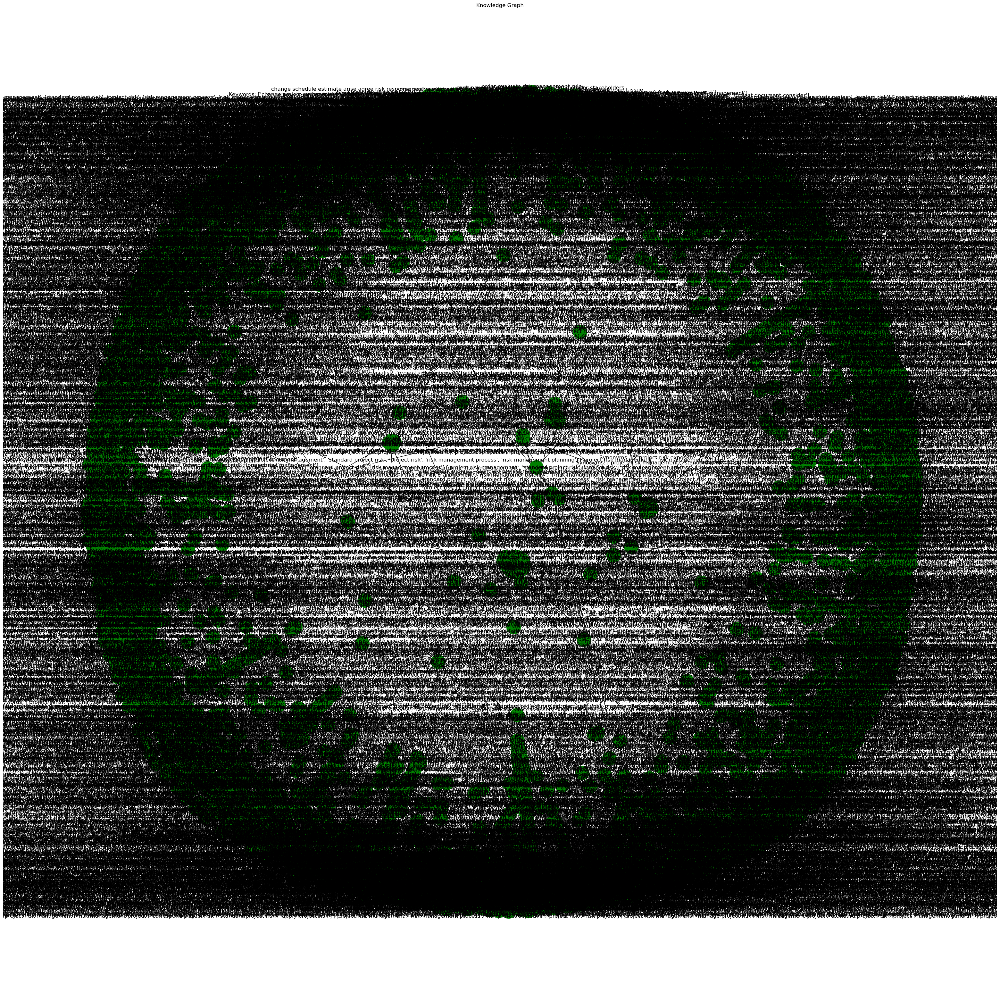

In [87]:
# Visualization
pos = nx.spring_layout(knowledge_graph)
labels = {node: f"{node}\nKeywords: {knowledge_graph.nodes[node]['Keywords']}\nSynonyms: {knowledge_graph.nodes[node]['Synonyms']}" for node in concepts}
edge_labels = {(edge[0], edge[1]): data['relationship'] for edge, data in knowledge_graph.edges.items()}

# Use a different variable name for the figure
fig, axes = plt.subplots(figsize=(40, 40), clear=True)
nx.draw(knowledge_graph, pos, with_labels=True, labels=labels, node_size=1000, node_color='green', font_size=12, ax=axes)
nx.draw_networkx_edge_labels(knowledge_graph, pos, edge_labels=edge_labels, font_size=10)
plt.title("Knowledge Graph")
plt.axis('off')
plt.show()


In [4]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
import dgl
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
# Convert the NetworkX graph to a DGL graph and add self-loops
G_dgl = dgl.add_self_loop(dgl.from_networkx(knowledge_graph))

## GNN Model:

In [18]:
# Define a Graph Neural Network (GNN) model
class GNN(nn.Module):
    def __init__(self, in_feats, hidden_feats, out_feats, num_layers):
        super(GNN, self).__init__()
        self.layers = nn.ModuleList([
            dgl.nn.GraphConv(in_feats if i == 0 else hidden_feats, hidden_feats, activation=F.relu)
            for i in range(num_layers - 1)
        ])
        self.layers.append(dgl.nn.GraphConv(hidden_feats, out_feats))

    def forward(self, g, features):
        h = features
        for layer in self.layers:
            h = layer(g, h)
        return h

## Splitting 80%:

In [19]:
# Generate random node features and labels
features = torch.rand(G_dgl.number_of_nodes(), 1509)
labels = torch.randint(0, 2, (G_dgl.number_of_nodes(),))
# Split the data into training and testing sets
train_indices, test_indices = train_test_split(range(G_dgl.number_of_nodes()), test_size=0.2, stratify=labels)
train_mask = torch.zeros(G_dgl.number_of_nodes(), dtype=torch.bool)
test_mask = torch.zeros(G_dgl.number_of_nodes(), dtype=torch.bool)
train_mask[train_indices] = True
test_mask[test_indices] = True

## Finding best param:

In [20]:
import itertools
# Hyperparameter tuning (Grid Search)
hyperparams_grid = {
    'hidden_feats': [32, 64, 128],
    'num_layers': [2, 3, 4],
    'learning_rate': [0.001, 0.01, 0.1]
}

best_params = None
best_loss = float('inf')

for params in itertools.product(*hyperparams_grid.values()):
    hidden_feats, num_layers, learning_rate = params
    model = GNN(in_feats=1509, hidden_feats=hidden_feats, out_feats=2, num_layers=num_layers)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate)

    for epoch in range(100):
        model.train()
        optimizer.zero_grad()
        logits = model(G_dgl, features.float())
        loss = criterion(logits[train_mask], labels[train_mask])
        loss.backward()
        optimizer.step()

    with torch.no_grad():
        model.eval()
        logits_val = model(G_dgl, features.float())
        loss_val = criterion(logits_val[test_mask], labels[test_mask])

    if loss_val < best_loss:
        best_loss = loss_val
        best_params = params

print(f'Best Hyperparameters: {best_params}, Best Validation Loss: {best_loss.item()}')


Best Hyperparameters: (128, 3, 0.01), Best Validation Loss: 0.6916348934173584


###### 1509  columns:(pmbook +PMI)

In [21]:
in_dim = 1509  # Dimension of entity embeddings
hidden_dim = 128  # Dimension of hidden layers
out_dim = 2  # Dimension of the final output
num_layer = 3  # Number of GCN layers
model = GNN(in_feats=in_dim, hidden_feats=hidden_dim, out_feats=out_dim, num_layers=num_layer)

## Optimizing:

In [22]:
# Define your loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=0.01)

## Training:

In [23]:
# Training loop
num_epochs = 1000
for epoch in range(num_epochs):
    model.train()
    optimizer.zero_grad()
    logits = model(G_dgl, features.float())
    loss = criterion(logits[train_mask], labels[train_mask])
    loss.backward()
    optimizer.step()

    # Print additional metrics
    with torch.no_grad():
        model.eval()
        train_pred = torch.argmax(logits[train_mask], dim=1)
        acc = accuracy_score(labels[train_mask].numpy(), train_pred.numpy())
        precision = precision_score(labels[train_mask].numpy(), train_pred.numpy())
        recall = recall_score(labels[train_mask].numpy(), train_pred.numpy())
        f1 = f1_score(labels[train_mask].numpy(), train_pred.numpy())

    print(f'Epoch {epoch + 1}/{num_epochs}, Loss: {loss.item()}, Accuracy: {acc}, Precision: {precision}, Recall: {recall}, F1: {f1}')


Epoch 1/1000, Loss: 0.7280586361885071, Accuracy: 0.5106294289287203, Precision: 0.5102664919178681, Recall: 0.9565929565929566, F1: 0.6655270655270655
Epoch 2/1000, Loss: 26.661834716796875, Accuracy: 0.4910379324718633, Precision: 0.0, Recall: 0.0, F1: 0.0


C:\Users\hamma\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\hamma\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 3/1000, Loss: 4.228583335876465, Accuracy: 0.4910379324718633, Precision: 0.0, Recall: 0.0, F1: 0.0
Epoch 4/1000, Loss: 1.134826898574829, Accuracy: 0.5089620675281368, Precision: 0.5089620675281368, Recall: 1.0, F1: 0.6745856353591161
Epoch 5/1000, Loss: 1.0244516134262085, Accuracy: 0.5089620675281368, Precision: 0.5089620675281368, Recall: 1.0, F1: 0.6745856353591161
Epoch 6/1000, Loss: 0.6951009035110474, Accuracy: 0.4964568570237599, Precision: 0.5844155844155844, Recall: 0.036855036855036855, F1: 0.06933744221879815
Epoch 7/1000, Loss: 0.8365573883056641, Accuracy: 0.4910379324718633, Precision: 0.0, Recall: 0.0, F1: 0.0
Epoch 8/1000, Loss: 0.734907329082489, Accuracy: 0.4910379324718633, Precision: 0.0, Recall: 0.0, F1: 0.0


C:\Users\hamma\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\hamma\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 9/1000, Loss: 0.7230677604675293, Accuracy: 0.5089620675281368, Precision: 0.5089620675281368, Recall: 1.0, F1: 0.6745856353591161
Epoch 10/1000, Loss: 0.7988287806510925, Accuracy: 0.5089620675281368, Precision: 0.5089620675281368, Recall: 1.0, F1: 0.6745856353591161
Epoch 11/1000, Loss: 0.7312597632408142, Accuracy: 0.5089620675281368, Precision: 0.5089620675281368, Recall: 1.0, F1: 0.6745856353591161
Epoch 12/1000, Loss: 0.7113516330718994, Accuracy: 0.49145477282200917, Precision: 0.6666666666666666, Recall: 0.001638001638001638, F1: 0.003267973856209151
Epoch 13/1000, Loss: 0.7423709630966187, Accuracy: 0.4910379324718633, Precision: 0.0, Recall: 0.0, F1: 0.0


C:\Users\hamma\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 14/1000, Loss: 0.7151764035224915, Accuracy: 0.4910379324718633, Precision: 0.5, Recall: 0.001638001638001638, F1: 0.0032653061224489797
Epoch 15/1000, Loss: 0.6960642337799072, Accuracy: 0.5089620675281368, Precision: 0.5089620675281368, Recall: 1.0, F1: 0.6745856353591161
Epoch 16/1000, Loss: 0.7242883443832397, Accuracy: 0.5089620675281368, Precision: 0.5089620675281368, Recall: 1.0, F1: 0.6745856353591161
Epoch 17/1000, Loss: 0.7086290121078491, Accuracy: 0.5089620675281368, Precision: 0.5089620675281368, Recall: 1.0, F1: 0.6745856353591161
Epoch 18/1000, Loss: 0.6924170851707458, Accuracy: 0.5227177990829512, Precision: 0.5179414542020774, Recall: 0.8984438984438985, F1: 0.6570829589697513
Epoch 19/1000, Loss: 0.7075273394584656, Accuracy: 0.49145477282200917, Precision: 0.6, Recall: 0.002457002457002457, F1: 0.004893964110929854
Epoch 20/1000, Loss: 0.7080463767051697, Accuracy: 0.49145477282200917, Precision: 0.6, Recall: 0.002457002457002457, F1: 0.004893964110929854
Epoc

C:\Users\hamma\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Epoch 81/1000, Loss: 0.7414641380310059, Accuracy: 0.4910379324718633, Precision: 0.0, Recall: 0.0, F1: 0.0
Epoch 82/1000, Loss: 0.6766414642333984, Accuracy: 0.5122967903293039, Precision: 0.5106649937264742, Recall: 1.0, F1: 0.676079734219269
Epoch 83/1000, Loss: 0.6787620782852173, Accuracy: 0.511879949979158, Precision: 0.5104515050167224, Recall: 1.0, F1: 0.6758926100193745
Epoch 84/1000, Loss: 0.7044031620025635, Accuracy: 0.4910379324718633, Precision: 0.5, Recall: 0.000819000819000819, F1: 0.0016353229762878171
Epoch 85/1000, Loss: 0.6566856503486633, Accuracy: 0.6857023759899958, Precision: 0.6358347876672484, Recall: 0.8951678951678952, F1: 0.7435374149659866
Epoch 86/1000, Loss: 0.6907911896705627, Accuracy: 0.5093789078782827, Precision: 0.5091743119266054, Recall: 1.0, F1: 0.6747720364741641
Epoch 87/1000, Loss: 0.6617993116378784, Accuracy: 0.5794080867027929, Precision: 0.7834224598930482, Recall: 0.23996723996723995, F1: 0.36739811912225706
Epoch 88/1000, Loss: 0.669992

## Evaluation:

In [26]:
model.eval()
with torch.no_grad():
    logits = model(G_dgl, features.float())
    probs = torch.softmax(logits, dim=1)
    classes = torch.argmax(probs, dim=1)

    labels_bin = labels[test_mask].numpy()
    
    acc = accuracy_score(labels_bin, classes[test_mask])
    prec = precision_score(labels_bin, classes[test_mask])
    rec = recall_score(labels_bin, classes[test_mask])
    f1 = f1_score(labels_bin, classes[test_mask])


    print(f'Acc: {acc}')
    print(f'Prec: {prec}')
    print(f'Rec: {rec}')
    print(f'F1: {f1}')

Acc: 0.7661525635681534
Prec: 0.6866515837104072
Rec: 0.7706797706797707
F1: 0.7713831478537361


## After training, the model undergoes parameter updates, enabling the generation of embeddings.

In [10]:
embeddings = model(G_dgl, features.float()).detach()


##### For recommendation purposes, the following function calculates cosine similarity between a query and all nodes, selecting the top k nodes with the highest similarity.

In [30]:
from sklearn.metrics.pairwise import cosine_similarity

def r(q, layer=5):
    i = df[df["Subject"].str.lower() == q.lower()].index.tolist()
    if not i:
        print(f"{q} not found.")
        return
    e = model(G_dgl, features.float())[i].detach().numpy()
    a = model(G_dgl, features.float()).detach().numpy()
    s = cosine_similarity(e, a)
    t = s.argsort(axis=1)[:, -layer:][:, ::-1]
    print(f"Recommendations:")
    # Display recommendations for each query
    for i, indices in enumerate(t):
        for idx in indices:
            if 0 <= idx < len(concepts):
                print(f"{concepts[idx]} ")
                print(f"=>in row : {idx} - |accuracy: {s[i, idx]}")
                print(f"                               --------------------Definition------------------ ")
                print()
                print(df["Definition"][idx])
                print(f"                             ------------------------------------------------- ")  
                print()
                print()
# Example usage
r('risk', layer=5)


Recommendations:
additional risk 
=>in row : 1025 - |accuracy: 1.0000001192092896
                               --------------------Definition------------------ 

objective plan risk response process determine set action enhance chance project success comply applicable organizational project constraint risk identify analyze prioritize plan develop address risk project team consider sufficiently important threat pose project objective opportunity offer planning entail agree action take potential change budget schedule resource scope action cause contingent risk response action need execute optimum time reason response specification risk include description correspond trigger condition responsibility monitor project condition implement correspond action clearly assign risk allocate risk owner part identify risk process correspond risk response assign specific risk action owner risk owner responsible ensure risk response effective plan additional risk response require risk action owner r